In [1]:
#from google.colab import drive
#drive.mount('/content/drive/', force_remount=True)
#%cd '/content/drive/MyDrive/VOF_DIR/VOF/'

In [2]:
#!pip install nevergrad
#!pip install --pre -U pycaret
#!pip install darts

In [ ]:
#import vof
from vof import forecaster
from vof import optimizer

In [1]:
import numpy as np
import matplotlib.pyplot as plt
import altair as alt
import pandas as pd
import statsmodels.api as sm
from darts.utils.statistics import check_seasonality, plot_acf, plot_residuals_analysis
import statsmodels.tsa.stattools
from sklearn import linear_model
from sklearn.preprocessing import OneHotEncoder

from sklearn.ensemble import RandomForestRegressor
from sklearn.ensemble import GradientBoostingRegressor
from catboost import CatBoostRegressor
import time
import random
#from fbprophet import Prophet
from sklearn.model_selection import train_test_split
from statsmodels.tsa.api import ExponentialSmoothing, SimpleExpSmoothing, Holt
from sklearn.multioutput import MultiOutputRegressor
import lightgbm as lgb
from datetime import date
import nevergrad as ng
from joblib import Parallel, delayed
import time
from sklearn import metrics
import math 
from darts.utils import timeseries_generation as tg
from darts import TimeSeries
from darts.metrics import rmse
# from darts import SeasonalityMode, TrendMode, ModelMode

from darts.models import Theta, FFT, ExponentialSmoothing, Prophet, RegressionModel,NaiveSeasonal,LightGBMModel,RandomForest,forecasting,ARIMA
# import darts.models
from darts.utils.utils import SeasonalityMode, TrendMode, ModelMode
import statsmodels

plt.rcParams['figure.figsize'] = [18, 8]
plt.rcParams.update({'font.size': 22})

## Getting the data: 2014-2015 only

In [2]:
data = pd.read_csv('data/ecomm/sales_train_data_merged_CA_3_2014.csv',index_col='date').fillna(0)[:-1]
data.index = data.index.astype('datetime64[ns]')
data = data.loc['2014-01-01':'2016-01-01']

data.reset_index(inplace=True)

## Some easy processing

In [3]:
#modify wday into sin and cos to get rid if hierarchy in the cat numbers

#data['sin_wday'] = data.wday.apply(math.sin)
#data['cos_wday'] = data.wday.apply(math.cos)

# transfor unique event days into bool
data['event_1'] = data.event_name_1.map({0:0}).fillna(1)
data['event_2'] = data.event_name_2.map({0:0}).fillna(1)

# still want to know the type though

data = data.join(pd.get_dummies(data.event_type_1, prefix='event_type_1'))
data = data.join(pd.get_dummies(data.event_type_2, prefix='event_type_2'))

# getting rid of irrelevant data

data = data.drop(['d','id','store_id','weekday','wday',
                  'event_name_1', 'event_name_2',
                  'event_type_1','event_type_2',
                  'year','snap_TX','snap_WI'], axis=1)

### aggregate data weekly

In [4]:
#weekly_sale_price = pd.DataFrame(data.groupby('item_id').resample('W-Mon', on='date').min()['sell_price'])
#unique_prices = pd.DataFrame(data.groupby('item_id').resample('W-Mon', on='date').nunique()['sell_price'])
#data = data.groupby('item_id').resample('W-Mon', on='date').sum()
#data['sell_price'] = weekly_sale_price['sell_price']
#data['price_changes'] = unique_prices['sell_price'] - 1

In [5]:
data.reset_index(inplace=True)
data.head()

,index,date,item_id,sell_price,month,snap_CA,sales,event_1,event_2,event_type_1_0,event_type_1_Cultural,event_type_1_National,event_type_1_Religious,event_type_1_Sporting,event_type_2_0,event_type_2_Cultural,event_type_2_Religious
0,0,2014-01-01,HOBBIES_1_001,8.26,1.0,1.0,2.0,1.0,0.0,0,0,1,0,0,1,0,0
1,1,2014-01-02,HOBBIES_1_001,8.26,1.0,1.0,1.0,0.0,0.0,1,0,0,0,0,1,0,0
2,2,2014-01-03,HOBBIES_1_001,8.26,1.0,1.0,0.0,0.0,0.0,1,0,0,0,0,1,0,0
3,3,2014-01-04,HOBBIES_1_001,8.26,1.0,1.0,0.0,0.0,0.0,1,0,0,0,0,1,0,0
4,4,2014-01-05,HOBBIES_1_001,8.26,1.0,1.0,0.0,0.0,0.0,1,0,0,0,0,1,0,0


In [84]:
data.loc[data.item_id=='HOUSEHOLD_1_118'].corr()['sales']

index                     0.024385
sell_price                     NaN
month                     0.056481
snap_CA                  -0.024052
sales                     1.000000
event_1                  -0.082211
event_2                  -0.022905
event_type_1_0            0.082211
event_type_1_Cultural    -0.011910
event_type_1_National    -0.078179
event_type_1_Religious   -0.060521
event_type_1_Sporting     0.020717
event_type_2_0            0.022905
event_type_2_Cultural    -0.032968
event_type_2_Religious    0.000597
Name: sales, dtype: float64

### Now let's pick 3 most popular items to work with them further.

We will also plot sales for the items

In [6]:
top_items = data.groupby('item_id').sum().sort_values(by='sales').index[-3:]

alt.data_transformers.disable_max_rows()

alt.Chart(data.loc[data.item_id.isin(top_items)]).mark_line().encode(
    x='date:T',
    y=alt.Y('sales:Q'),
    color='item_id',
    tooltip=['item_id','date:T','sales:Q']
).properties(width=500, height=400)

INFO:numexpr.utils:Note: NumExpr detected 64 cores but "NUMEXPR_MAX_THREADS" not set, so enforcing safe limit of 8.
INFO:numexpr.utils:NumExpr defaulting to 8 threads.


alt.Chart(...)

In [7]:
def get_input_item(item_id='HOUSEHOLD_1_110'):
    item = data.loc[data.item_id.isin([item_id])]
    #item.loc[item.sales<=0,'sales'] = item.sales.median()
    return item

len(get_input_item(item_id='HOUSEHOLD_1_110'))

731

In [ ]:
#sm.graphics.tsa.plot_pacf(get_input_item(item_id='HOUSEHOLD_1_110').sales,lags=100)

## Building prediction models

In [8]:
def eval_model(model, 
               input_timeseries,
               past_covariates=None, 
               future_covariates=None, 
               retrain = False, 
               plot_backtest=True):
    # Past and future covariates are optional because they won't always be used in our tests
    
    # We backtest the model on the last 20% of the flow series, with a horizon of 10 steps:
    backtest = model.historical_forecasts(series=input_timeseries, 
                                          past_covariates=past_covariates,
                                          future_covariates=future_covariates,
                                          start=0.5, 
                                          retrain=retrain,
                                          verbose=True, 
                                          forecast_horizon=1)
    
    if plot_backtest:
        input_timeseries[-len(backtest)-14:].plot()
        backtest.plot(label='backtest (n=10)')
    print(str(model)+' Backtest RMSE = {}'.format(rmse(input_timeseries, backtest)))


def get_historical_forecasts(model, 
                             input_timeseries,
                             future_covariates=None,
                             past_covariates=None,
                             model_display_name=None, 
                             past_covs = False,
                             future_covs = False):

    horizon = 1
    
    forecast = model.historical_forecasts(input_timeseries,
                                              forecast_horizon=horizon, 
                                              stride=1, 
                                              verbose=True,
                                              past_covariates = past_covariates if past_covs else None,
                                              future_covariates = future_covariates if future_covs else None,
                                              start=60,
                                              last_points_only=False,
                                              overlap_end=False)
        
    res_df = pd.DataFrame()

    for i in range(len(forecast)):
        pred_df = forecast[i].pd_dataframe()
        pred_df['prediction_date'] = forecast[i].get_timestamp_at_point(0)
        pred_df['model'] = model_display_name
        pred_df.reset_index(inplace=True)
        pred_df.columns = ['ts','value','prediction_date','model']
        res_df = res_df.append(pred_df)
    
    if future_covs == False:
        return res_df.iloc[:-(horizon*2)]
    else:
        return res_df
    #return res_df

In [10]:
 def create_forecast_for_item(itemid, lags = [-1,-2,-52],lags_future_covariates=[0,1]):
    
    input_timeseries = TimeSeries.from_dataframe(get_input_item(itemid).set_index('date'), value_cols=['sales'])

    
    val_cols = data.drop(['date', 'item_id', 'sell_price', 'sales'],axis=1).columns
    
    external_covs = TimeSeries.from_dataframe(get_input_item(itemid).set_index('date'), 
                                       value_cols=val_cols)
    
    
    # We first set aside the first 50% as training series:
    input_train, _ = input_timeseries.split_before(0.50)

    naive_model_weekly = NaiveSeasonal(K=7)
    naive_model_weekly.fit(input_train)

    regr_model_lags =  RegressionModel(lags=lags)
    regr_model_lags.fit(input_train)

    regr_model_cov = RegressionModel(lags=lags,
                                     lags_past_covariates = lags,
                                     lags_future_covariates = lags_future_covariates)
    
    regr_model_cov.fit(input_train,
                       future_covariates = external_covs,
                       past_covariates = external_covs)

    """
    lgbm_model_cov = LightGBMModel(lags = lags,
                                   lags_past_covariates = lags,
                                   lags_future_covariates = lags_future_covariates,
                                   #boosting_type='gbdt', 
                                   #num_leaves=50, 
                                   #max_depth= 10, 
                                   #learning_rate=0.075, 
                                   n_estimators=100)
    
    lgbm_model_cov.fit(input_train,
                       future_covariates = external_covs,
                       past_covariates = external_covs)

    lgbm_model = LightGBMModel(lags=lags,
                               boosting_type='gbdt', 
                               #num_leaves=50, 
                               #max_depth= 10, 
                               #learning_rate=0.075, 
                               n_estimators=100)
    
    lgbm_model.fit(input_train)
    """
    rf_model = RandomForest(lags=lags,
                               max_depth= 10, 
                               n_estimators=500)
    
    rf_model.fit(input_train)
    
    rf_model_cov = RandomForest(lags=lags,
                                lags_past_covariates=lags,
                                lags_future_covariates = lags_future_covariates,
                               max_depth= 10, 
                               n_estimators=500)
    
    rf_model_cov.fit(input_train,
                     future_covariates = external_covs,
                       past_covariates = external_covs)

    theta_model =  Theta(2,
                         season_mode=SeasonalityMode.ADDITIVE)
    
    theta_model.fit(input_train)
    
    
    models = {'Naive weekly':[naive_model_weekly,False,False],
              'Regression':[regr_model_lags,False,False],
              #'RegressionModelCov':[regr_model_cov,True,True],
              #'LGBM_cov':[lgbm_model_cov,True,True],
              #'LGBM':[lgbm_model,False,False],
              'RF':[rf_model,False,False],
              'RF_cov':[rf_model_cov,True,True],
              'Theta':[theta_model,False,False],
              #'ARIMA':[arima_model,False]
             }

    forcasts_df = pd.DataFrame()

    runtime_df = pd.DataFrame(index=models.keys(),columns=['runtime'])
    
    parallel_forecasts = (Parallel(n_jobs=-1, verbose = 1000)\
                          (delayed(get_historical_forecasts)(models[model][0],
                                                             input_timeseries=input_timeseries,
                                                             model_display_name = model,
                                                             future_covariates = external_covs,
                                                             past_covariates = external_covs,
                                                             past_covs = models[model][1],
                                                             future_covs = models[model][2]) for model in models.keys()))
    #merge all models into a single dataframe forcasts_df
    for i in parallel_forecasts:
        forcasts_df = forcasts_df.append(i)

    forcasts_df['item_id'] = itemid

    return forcasts_df


In [ ]:
#create_forecast_for_item('HOUSEHOLD_1_118',lags_by_item['HOUSEHOLD_1_118'],lags_future_covariates=[1,2])
#[i for i in range(-1,-30,-1)]

In [11]:
top_items

Index(['HOUSEHOLD_1_118', 'HOUSEHOLD_1_459', 'HOBBIES_1_234'], dtype='object', name='item_id')

In [12]:
lags_by_item = {'HOUSEHOLD_1_118':[-1,-6,-7,-13,-14,-18,-21], 
                'HOBBIES_1_234':[-1,-6,-7,-13,-14,-18,-21],
               'HOUSEHOLD_1_459':[-1,-6,-7,-13,-14,-18,-21]
                }

optimization_df_parallel = (Parallel(n_jobs=-1, verbose = 1000)\
                            (delayed(create_forecast_for_item)(item,lags_by_item[item],
                                                               lags_future_covariates=[1,2]) for item in top_items.values))

#merge all items into a single dataframe
optimization_df = pd.DataFrame()
for i in optimization_df_parallel:
    optimization_df = optimization_df.append(i)

    optimization_df

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 64 concurrent workers.
[Parallel(n_jobs=-1)]: Done   1 tasks      | elapsed: 36.4min
[Parallel(n_jobs=-1)]: Done   3 out of   3 | elapsed: 37.4min remaining:    0.0s
[Parallel(n_jobs=-1)]: Done   3 out of   3 | elapsed: 37.4min finished


In [21]:
fact = optimization_df.loc[optimization_df.model=='Naive weekly'].copy()#.join('tmp.y.loc[optimization_df.index]')
fact.set_index(['ts','item_id'], inplace=True)
fact['model'] = 'Fact'
fact['value'] = data.reset_index().set_index(['date','item_id'])['sales']
#fact.loc[:,'FOODS_3_090',:].head()

In [22]:
fact = optimization_df.loc[optimization_df.model=='Naive weekly'].copy()#.join('tmp.y.loc[optimization_df.index]')
fact.set_index(['ts','item_id'], inplace=True)
fact['model'] = 'Fact'
fact['value'] = data.reset_index().set_index(['date','item_id'])['sales']

fact.reset_index(inplace=True)

if len(optimization_df.loc[optimization_df.model=='Fact'])==0:
    optimization_df = optimization_df.append(fact)

In [23]:
#optimization_df.loc[optimization_df.model=='Fact']

In [74]:
alt.Chart(optimization_df.loc[optimization_df.item_id == 'HOUSEHOLD_1_118']).mark_line().encode(
    x='prediction_date:T',
    y=alt.Y('value:Q',scale=alt.Scale(zero=True)),
    color=alt.Color('model:N'),
    tooltip=['model:N','prediction_date:T','value:Q'],
    #column='item_id:N'
).properties(width=600, height=400).interactive()

alt.Chart(...)

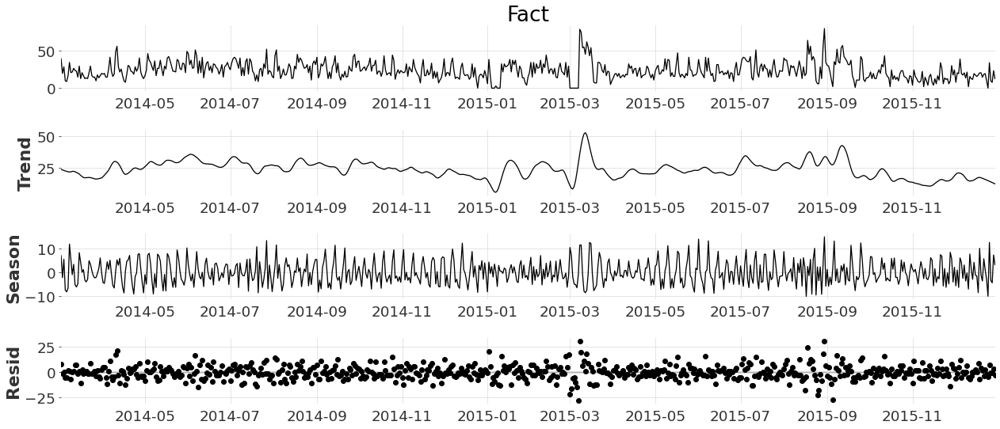

In [106]:
tmp_plot = optimization_df.loc[(optimization_df.item_id == 'HOUSEHOLD_1_459')].pivot_table(index = 'prediction_date', 
                                                                            columns = 'model',
                                                                           values = 'daily_revenue',
                                                                           aggfunc = 'sum')

tmp_plot['ensemble'] = tmp_plot.drop(['Fact','Naive weekly'],axis=1).mean(axis=1)

from statsmodels.tsa.seasonal import STL
res = STL(tmp_plot['Fact'], period=7).fit()
res.plot()
plt.show()

model,Fact,Naive weekly,RF,RF_cov,Regression,Theta,ensemble
model,,,,,,,
Fact,1.000000,0.103530,0.424674,0.378259,0.455788,0.445498,0.468960
Naive weekly,0.103530,1.000000,0.160240,0.311249,0.147373,0.272707,0.249282
RF,0.424674,0.160240,1.000000,0.791810,0.849786,0.752052,0.925549
RF_cov,0.378259,0.311249,0.791810,1.000000,0.692663,0.766349,0.890958
Regression,0.455788,0.147373,0.849786,0.692663,1.000000,0.775354,0.904714
Theta,0.445498,0.272707,0.752052,0.766349,0.775354,1.000000,0.917746
ensemble,0.468960,0.249282,0.925549,0.890958,0.904714,0.917746,1.000000


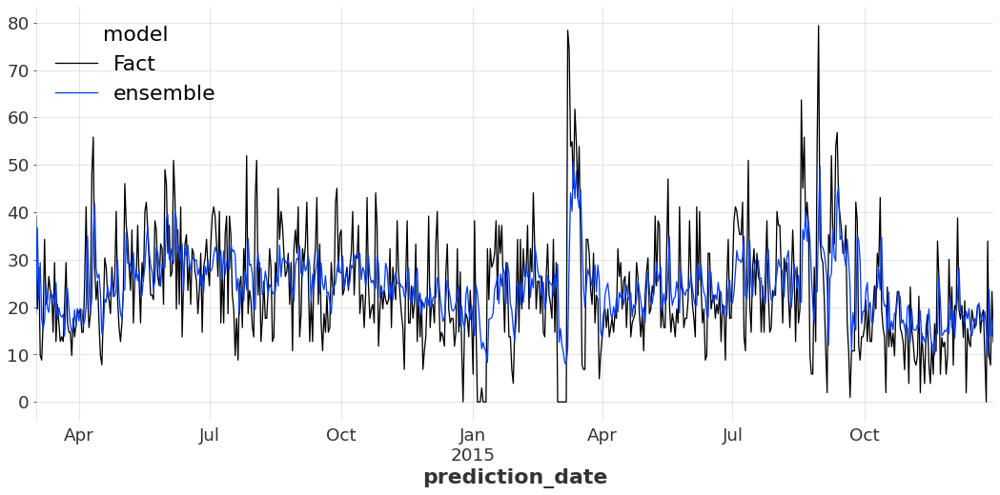

In [107]:
tmp_plot[['Fact','ensemble']].plot()

tmp_plot.corr()

In [108]:
for i in tmp_plot.columns:
    print(i, np.sqrt(np.mean((tmp_plot[i] - tmp_plot['Fact'])**2)))

Fact 0.0
Naive weekly 15.787421479791053
RF 10.837414530394172
RF_cov 11.191885951569645
Regression 10.55026704087149
Theta 11.035334118124366
ensemble 10.476501999308093


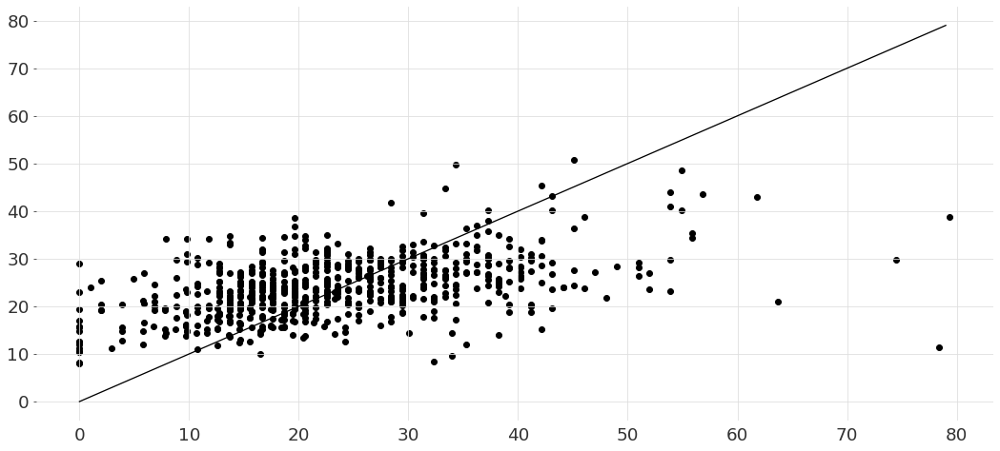

In [110]:
plt.scatter(tmp_plot['Fact'],tmp_plot['ensemble'])
plt.plot(np.arange(0,80),np.arange(0,80))

### Evaluation function for all item_ids

In [25]:
def get_item_rmse(item_id):
    
    res = pd.DataFrame(index=optimization_df.model.unique(), columns=['rmse'])
    
    df = optimization_df.loc[optimization_df.item_id==item_id].set_index(['prediction_date','ts'])
        
    for m in optimization_df.model.unique():
        fact_index = df.loc[df.model=='Fact'].index
        
        #print(m, len(df.loc[df.model=='Fact','value']),len(df.loc[df.model==m,'value']))
        mse = metrics.mean_squared_error(df.loc[df.model=='Fact','value'],df.loc[df.model==m,'value'])        
        res.loc[m,'rmse'] = math.sqrt(mse)
    
    res['rRMSE'] = res['rmse']/res.loc['Naive weekly','rmse']
    res['item_id'] = item_id
    res.reset_index(inplace=True)
    res.columns = ['model','rmse','rRMSE','item_id']
    return res

eval_df = pd.DataFrame()

for item in top_items.values:
    eval_df = eval_df.append(get_item_rmse(item), ignore_index=True)
    
eval_df.head()

,model,rmse,rRMSE,item_id
0,Naive weekly,14.664866,1.0,HOUSEHOLD_1_118
1,Regression,10.623418,0.724413,HOUSEHOLD_1_118
2,RF,10.711798,0.73044,HOUSEHOLD_1_118
3,RF_cov,11.249391,0.767098,HOUSEHOLD_1_118
4,Theta,10.697782,0.729484,HOUSEHOLD_1_118


In [26]:
alt.Chart(eval_df.loc[eval_df.model!='RegressionModelCov'], title = 'RMSE for items, by model').mark_bar().encode(
    x=alt.X('model:N',scale=alt.Scale(zero=False)),
    y=alt.Y('rmse:Q',scale=alt.Scale(zero=False)),
    color=alt.Color('model:N'),
    column='item_id:N'
).properties(width=200, height=250)#.interactive()

alt.Chart(...)

In [27]:
(eval_df.groupby(['model']).sum()[['rRMSE','rmse']]/len(lags_by_item)).reset_index()

,model,rRMSE,rmse
0,Fact,0.000000,0.000000
1,Naive weekly,1.000000,26.937384
2,RF,0.724619,19.878952
3,RF_cov,0.748193,20.374427
4,Regression,0.709601,19.405226
5,Theta,0.716062,19.322861


In [28]:
alt.Chart((eval_df.loc[eval_df.model!='RegressionModelCov'].groupby(['model']).sum()[['rRMSE','rmse']]/len(lags_by_item)).reset_index(),
         title='Average rRMSE for all items, by model').mark_bar().encode(
    x=alt.X('model:N'),
    y=alt.Y('rRMSE:Q',scale=alt.Scale(zero=False)),
    color=alt.Color('model:N'),
).properties(width=200, height=250)#.interactive()

alt.Chart(...)

# Optimizer

### Starting with calculating actual daily revenue for each of the items (value * price) and checking total revenue for the set.

In [29]:
items_prices = data.loc[data.item_id.isin(top_items)].set_index(['item_id','date'])['sell_price']
optimization_df.set_index(['item_id','ts'], inplace=True)
optimization_df['sell_price'] = items_prices
optimization_df.reset_index(inplace=True)

optimization_df['daily_revenue'] = optimization_df.value*optimization_df.sell_price
optimization_df

,item_id,ts,value,prediction_date,model,sell_price,daily_revenue
0,HOUSEHOLD_1_118,2014-03-02,20.0,2014-03-02,Naive weekly,0.97,19.40
1,HOUSEHOLD_1_118,2014-03-03,4.0,2014-03-03,Naive weekly,0.97,3.88
2,HOUSEHOLD_1_118,2014-03-04,20.0,2014-03-04,Naive weekly,0.97,19.40
3,HOUSEHOLD_1_118,2014-03-05,14.0,2014-03-05,Naive weekly,0.97,13.58
4,HOUSEHOLD_1_118,2014-03-06,16.0,2014-03-06,Naive weekly,0.97,15.52
...,...,...,...,...,...,...,...
12037,HOBBIES_1_234,2015-12-26,68.0,2015-12-26,Fact,0.30,20.40
12038,HOBBIES_1_234,2015-12-27,89.0,2015-12-27,Fact,0.30,26.70
12039,HOBBIES_1_234,2015-12-28,0.0,2015-12-28,Fact,0.30,0.00
12040,HOBBIES_1_234,2015-12-29,3.0,2015-12-29,Fact,0.30,0.90


In [30]:
#weekly_revenue_bl = optimization_df.groupby(['model','prediction_date']).sum().daily_revenue.reset_index()
weekly_revenue_bl = optimization_df.pivot_table(columns='model',index='prediction_date', values='daily_revenue', aggfunc='sum')

In [31]:
alt.Chart(weekly_revenue_bl).transform_fold(
    weekly_revenue_bl.columns.values,
    #['Fact'],
    as_=['Model', 'Measurement']
).mark_bar(
    opacity=0.5,
    binSpacing=0
).encode(
    alt.X('Measurement:Q', bin=alt.Bin(maxbins=50)),
    alt.Y('count()', stack=None),
    alt.Color('Model:N')
    )

alt.Chart(...)

### Optimization target:
* Every week we make predictions for each item and calculate total profit for the week
* Profit is calculated as all the money that we earn minus cost of items for us. Cost of each item is 20% of it's final price
* We implement a discounts for each induvidual product to increase sales 
* Effect of a discount is pre-set: we get 3% increase in sales for each 1% discount

* Some limitations: 
 * Amount of discount shouldn't be more than 60%
 * Limit on max amount of items sold is 150% of maximum sold during the period we are looking at

In [32]:
from vof import optimizer

class OptimalDecisionMakersSales(optimizer.OptimalDecisionMakers):
    

    def __init__(self, data, target):
        super().__init__(data, target)
        self.EVALUATE = False
        self.TIME_HORIZON = 1
        self.DECISION_TIMESTEP = 1
        self.MAX_CAPACITY = (data.loc[data.model=='Fact'].groupby(['item_id','prediction_date']).sum().reset_index().groupby('item_id').max()['value']*1.5).apply(math.ceil)
        #self.BASIC_PRICES = items_prices
        #self.LAST2W_DISCOUNTS = [0,0,0,0,0,0]
            
    def cost_function(self,solution,capacity_limits):
        
        capacity_penalty = 1
        #w3_discount_penalty = 1
        penalty_lower_than_forecast = 1

        solution = np.array(solution)/100   
        
        self.candidate.set_index('item_id', inplace=True)
        self.candidate['disount'] = self.candidate['sell_price']*(solution)/self.candidate['sell_price']
        self.candidate['sell_price_w_disount'] = self.candidate['sell_price']*(1 - solution)
        
        self.candidate['value_increase'] = pd.DataFrame(index=self.candidate['sell_price'].index, 
                                                        data=solution*3,
                                                        columns=['value_increase']) #3% increase in sales for each 1% increase in discount
        

        self.candidate['value_w_disount'] = self.candidate.value + self.candidate.value_increase*self.candidate.value
        self.candidate['daily_revenue_w_disount'] = self.candidate['value_w_disount']*self.candidate['sell_price_w_disount']
        
        self.candidate['daily_profit'] = self.candidate['value']*(self.candidate['sell_price'] - self.candidate['sell_price']*.2)
        self.candidate['daily_profit_w_disount'] = self.candidate['value_w_disount']*(self.candidate['sell_price_w_disount'] - self.candidate['sell_price']*.2)
        
        self.candidate.reset_index(inplace=True)
        
        #penalty for exceeding limit on max amount of items sold (150% of maximum sold during the period we are looking at)
        if any(self.candidate.groupby('item_id').sum()['value_w_disount']>self.MAX_CAPACITY):
            capacity_penalty = 10000
            

        #penalty if daily_profit_w_discount is lower than forecasted profit without it
        if sum(self.candidate['daily_profit_w_disount'])<sum(self.candidate['daily_profit']):
            penalty_lower_than_forecast = 10000
            #print('penalty_lower_than_forecast')        

        #maximize daily profit with discount vs daily profit without it
        total_cost = -sum(self.candidate['daily_profit_w_disount'] - self.candidate['daily_profit']) + capacity_penalty + penalty_lower_than_forecast 

        return total_cost

    
    def calculate_optimal_decision(self, model):
        
        print(model)

        total_steps = self.data['prediction_date'].unique()

        recommendation = pd.DataFrame()
        
        for step in total_steps:
            
            print(step)
            
            discounts = ng.p.Choice(range(0,70,10),repetitions=len(top_items))
                
            instru = ng.p.Instrumentation(discounts,self.MAX_CAPACITY)
            optimizer = ng.optimizers.CMA(parametrization=instru, budget=1000)
            
            try:
                
                self.candidate = self.data.loc[(self.data.prediction_date==step)&(self.data.model==model)]
                
            except:
                
                print(self.data.loc[(self.data.prediction_date==step)&(self.data.model==model),'value'])


            
            step_recommendation = optimizer.minimize(self.cost_function)[0][0].value # self.candidate will be modified inside cost function
                        
            #create a slice for each model and each item with N days in time horizon
            rec_df = self.candidate.set_index(['model','item_id','prediction_date','ts']).loc[(slice(None), 
                                                                                               slice(None),
                                                                                               slice(None), 
                                                                                               pd.date_range(start=step, 
                                                                                                             periods=self.DECISION_TIMESTEP)
                                                                                               )].reset_index()
            recommendation = recommendation.append(pd.DataFrame(rec_df), ignore_index=True)
            
         
        return recommendation
    

    def select_value_optimal_model(self,models,return_predictions=False):
        
        random.seed(42)
                
        self.optimal_decision_result = (Parallel(n_jobs=-1, verbose = 1000)(delayed(self.calculate_optimal_decision)(model) for model in models))

        return self.optimal_decision_result
    
    def evaluate(self):
        return evaluation_df

In [33]:
odm = OptimalDecisionMakersSales(optimization_df,'Fact')

In [34]:
optimization_df.model.unique()

array(['Naive weekly', 'Regression', 'RF', 'RF_cov', 'Theta', 'Fact'],
      dtype=object)

In [35]:
#odm.calculate_optimal_decision('Naive weekly')

In [36]:
#sol = odm.calculate_optimal_decision(model='Naive weekly')
sol = odm.select_value_optimal_model(models=optimization_df.model.unique())

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 64 concurrent workers.
[Parallel(n_jobs=-1)]: Done   1 tasks      | elapsed: 84.7min
[Parallel(n_jobs=-1)]: Done   2 out of   6 | elapsed: 85.3min remaining: 170.5min
[Parallel(n_jobs=-1)]: Done   3 out of   6 | elapsed: 85.4min remaining: 85.4min
[Parallel(n_jobs=-1)]: Done   4 out of   6 | elapsed: 85.7min remaining: 42.9min
[Parallel(n_jobs=-1)]: Done   6 out of   6 | elapsed: 90.4min remaining:    0.0s
[Parallel(n_jobs=-1)]: Done   6 out of   6 | elapsed: 90.4min finished


In [37]:
result_df = pd.DataFrame()

for col in range(len(sol)):
    result_df = result_df.append(sol[col], ignore_index=True)

## Evaluation of optimization based on Fact values

In [ ]:
result_df.to_csv('ecomm_opt_result_CA_3_2015.csv')

In [39]:
result_df.set_index(['item_id','prediction_date','ts'], inplace=True)
result_df = result_df.join(result_df.loc[result_df.model=='Fact',['value','daily_profit']], rsuffix='_fact')
result_df.reset_index(inplace=True)
result_df['value_w_disount_fact'] = result_df['value_fact'] + result_df['value_fact']*result_df['value_increase']
result_df['daily_profit_w_disount_fact'] = result_df['value_w_disount_fact']*(result_df.sell_price_w_disount - result_df.sell_price*.2)

In [40]:
result_df

,item_id,prediction_date,ts,model,value,sell_price,daily_revenue,disount,sell_price_w_disount,value_increase,value_w_disount,daily_revenue_w_disount,daily_profit,daily_profit_w_disount,value_fact,daily_profit_fact,value_w_disount_fact,daily_profit_w_disount_fact
0,HOBBIES_1_234,2014-03-02,2014-03-02,Naive weekly,6.000000,0.30,1.800000,0.2,0.240,0.6,9.600000,2.304000,1.440000,1.728000,8.0,1.920,12.8,2.3040
1,HOBBIES_1_234,2014-03-02,2014-03-02,Regression,9.026987,0.30,2.708096,0.4,0.180,1.2,19.859372,3.574687,2.166477,2.383125,8.0,1.920,17.6,2.1120
2,HOBBIES_1_234,2014-03-02,2014-03-02,RF,4.294000,0.30,1.288200,0.2,0.240,0.6,6.870400,1.648896,1.030560,1.236672,8.0,1.920,12.8,2.3040
3,HOBBIES_1_234,2014-03-02,2014-03-02,RF_cov,10.362000,0.30,3.108600,0.2,0.240,0.6,16.579200,3.979008,2.486880,2.984256,8.0,1.920,12.8,2.3040
4,HOBBIES_1_234,2014-03-02,2014-03-02,Theta,15.048310,0.30,4.514493,0.2,0.240,0.6,24.077296,5.778551,3.611594,4.333913,8.0,1.920,12.8,2.3040
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
12037,HOUSEHOLD_1_459,2015-12-30,2015-12-30,Regression,22.521684,0.97,21.846033,0.2,0.776,0.6,36.034694,27.962923,17.476827,20.972192,13.0,10.088,20.8,12.1056
12038,HOUSEHOLD_1_459,2015-12-30,2015-12-30,RF,21.598600,0.97,20.950642,0.2,0.776,0.6,34.557759,26.816821,16.760513,20.112616,13.0,10.088,20.8,12.1056
12039,HOUSEHOLD_1_459,2015-12-30,2015-12-30,RF_cov,16.117081,0.97,15.633569,0.2,0.776,0.6,25.787330,20.010968,12.506855,15.008226,13.0,10.088,20.8,12.1056
12040,HOUSEHOLD_1_459,2015-12-30,2015-12-30,Theta,14.346097,0.97,13.915714,0.2,0.776,0.6,22.953755,17.812114,11.132571,13.359086,13.0,10.088,20.8,12.1056


## Inventory:
 * After predicting the demand N with discount we'll buy 1.1*N items. If in reality the demand is higher - that's the only amount we'll be able to sell
 * If we sell less items that been predicted, the rest goes bad, and the price (20%) is being deducted from the final profit

In [42]:
#result_weekly = result_df.groupby(['item_id','model','prediction_date']).sum()
#result_weekly[['sell_price','disount','sell_price_w_disount','value_increase']] = result_df.groupby(['item_id','model','prediction_date']).max()[['sell_price','disount','sell_price_w_disount','value_increase']]
result_df['inventory_left'] = 1.1*result_df['value_w_disount'] - result_df['value_w_disount_fact'] 
result_df['final_profit_w_discount'] = result_df['daily_profit_w_disount_fact']
result_df['final_profit_base_price'] = result_df['daily_profit_fact']


# if inventory_left>0 substract 40% of it's price from profits
result_df.loc[result_df.inventory_left>0,'final_profit_w_discount']  = result_df.loc[result_df.inventory_left>0,'daily_profit_w_disount_fact'] - result_df.loc[result_df.inventory_left>0,'inventory_left']*result_df.loc[result_df.inventory_left>0,'sell_price']*.4
result_df.loc[result_df.inventory_left>0,'final_profit_base_price']  = result_df.loc[result_df.inventory_left>0,'daily_profit_fact'] - result_df.loc[result_df.inventory_left>0,'inventory_left']*result_df.loc[result_df.inventory_left>0,'sell_price']*.4

# if inventory_lef<0 substract all additional items that we weren't able to sell
result_df.loc[result_df.inventory_left<0,'final_profit_w_discount'] = result_df.loc[result_df.inventory_left<0,'daily_profit_w_disount_fact'] + result_df.loc[result_df.inventory_left<0,'inventory_left']*result_df.loc[result_df.inventory_left<0,'sell_price_w_disount']
result_df.loc[result_df.inventory_left<0,'final_profit_base_price'] = result_df.loc[result_df.inventory_left<0,'daily_profit_fact'] + result_df.loc[result_df.inventory_left<0,'inventory_left']*result_df.loc[result_df.inventory_left<0,'sell_price']

result_df.head()

,item_id,prediction_date,ts,model,value,sell_price,daily_revenue,disount,sell_price_w_disount,value_increase,...,daily_revenue_w_disount,daily_profit,daily_profit_w_disount,value_fact,daily_profit_fact,value_w_disount_fact,daily_profit_w_disount_fact,inventory_left,final_profit_w_discount,final_profit_base_price
0,HOBBIES_1_234,2014-03-02,2014-03-02,Naive weekly,6.000000,0.3,1.800000,0.2,0.24,0.6,...,2.304000,1.440000,1.728000,8.0,1.92,12.8,2.304,-2.240000,1.766400,1.248000
1,HOBBIES_1_234,2014-03-02,2014-03-02,Regression,9.026987,0.3,2.708096,0.4,0.18,1.2,...,3.574687,2.166477,2.383125,8.0,1.92,17.6,2.112,4.245309,1.602563,1.410563
2,HOBBIES_1_234,2014-03-02,2014-03-02,RF,4.294000,0.3,1.288200,0.2,0.24,0.6,...,1.648896,1.030560,1.236672,8.0,1.92,12.8,2.304,-5.242560,1.045786,0.347232
3,HOBBIES_1_234,2014-03-02,2014-03-02,RF_cov,10.362000,0.3,3.108600,0.2,0.24,0.6,...,3.979008,2.486880,2.984256,8.0,1.92,12.8,2.304,5.437120,1.651546,1.267546
4,HOBBIES_1_234,2014-03-02,2014-03-02,Theta,15.048310,0.3,4.514493,0.2,0.24,0.6,...,5.778551,3.611594,4.333913,8.0,1.92,12.8,2.304,13.685026,0.661797,0.277797


In [43]:
result_df['profit_increase_model'] = (result_df['final_profit_w_discount']/result_df['final_profit_base_price']) - 1 

In [44]:
alt.data_transformers.disable_max_rows()

alt.Chart(result_df.loc[result_df.model=='Fact'].reset_index()).mark_line().encode(
    x='prediction_date:T',
    y=alt.Y('profit_increase_model:Q',scale=alt.Scale(zero=True)),
    color=alt.Color('model:N'),
    #row='model:N',
    column='item_id:N'
).properties(width=300, height=400)#.interactive()

alt.Chart(...)

In [45]:
#cumsum for this model

alt.data_transformers.disable_max_rows()

alt.Chart(result_df.reset_index()).mark_line().encode(
    x='prediction_date:T',
    y=alt.Y('final_profit_w_discount:Q',scale=alt.Scale(zero=True)),
    color=alt.Color('model:N'),
    #row='model:N',
    column='item_id:N'
).properties(width=300, height=400)#.interactive()

alt.Chart(...)

In [46]:
"""alt.Chart(result_df.loc[:,['Fact','LGBM_cov'],:].reset_index()).mark_line().encode(
    x='prediction_date:T',
    y=alt.Y('value:Q',scale=alt.Scale(zero=True)),
    color=alt.Color('model:N'),
    #row='model:N',
    column='item_id:N'
).properties(width=300, height=400)#.interactive()"""

"alt.Chart(result_df.loc[:,['Fact','LGBM_cov'],:].reset_index()).mark_line().encode(\n    x='prediction_date:T',\n    y=alt.Y('value:Q',scale=alt.Scale(zero=True)),\n    color=alt.Color('model:N'),\n    #row='model:N',\n    column='item_id:N'\n).properties(width=300, height=400)#.interactive()"

In [47]:
discounts_freq = result_df.reset_index().groupby(['model','disount']).count()['item_id'].reset_index()

alt.Chart(discounts_freq).mark_bar().encode(
    x='model:N',
    y=alt.Y('item_id:Q'),
    color=alt.Color('model:N'),
    #row='model:N',
    column='disount:N'
).properties(width=80, height=400)#.interactive()

alt.Chart(...)

In [48]:
eval_df.set_index(['model','item_id'], inplace=True)
eval_df['profit_increase_%'] = (result_df.groupby(['model','item_id']).sum()['final_profit_w_discount'] \
                                - result_df.groupby(['model','item_id']).sum().loc['Fact','final_profit_base_price']) \
                                /result_df.groupby(['model','item_id']).sum().loc['Fact','final_profit_base_price']
eval_df.reset_index(inplace=True)

In [49]:
alt.Chart(eval_df, title='').mark_circle().encode(
    x=alt.X('rRMSE:Q',scale=alt.Scale(zero=False)),
    y=alt.Y('profit_increase_%:Q',scale=alt.Scale(zero=False), axis=alt.Axis(format='%')),
    color=alt.Color('model:N'),
    column=alt.Column('item_id:N', title=""),
    tooltip = 'model:N'
).properties(width=150, height=250).interactive()

alt.Chart(...)

## Evaluation for all items in total

In [50]:
all_items_eval = result_df.groupby('model').sum()
all_items_eval['profit_increase_%'] = (all_items_eval.final_profit_w_discount - all_items_eval.loc['Fact','final_profit_base_price'])/all_items_eval.loc['Fact','final_profit_base_price']
all_items_eval['disount'] = result_df.groupby('model').mean()['disount']

<AxesSubplot:ylabel='Frequency'>

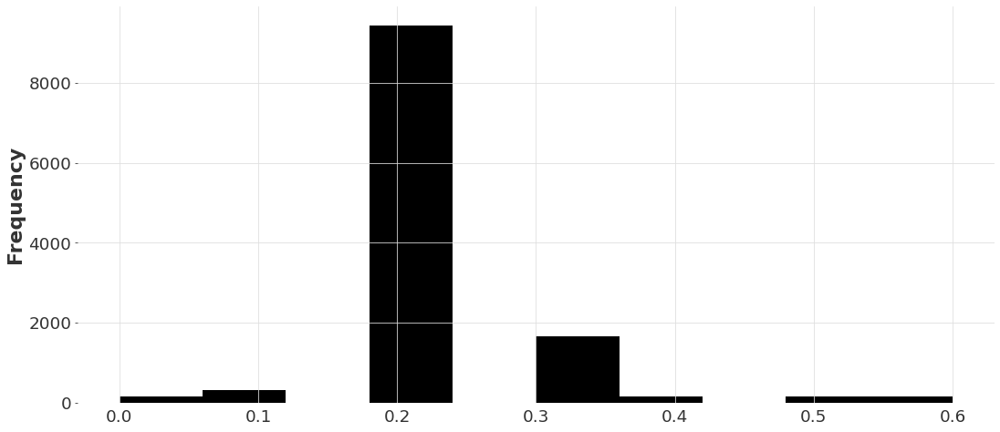

In [51]:
result_df['disount'].plot.hist()

In [52]:
alt.Chart(all_items_eval.reset_index()).mark_bar().encode(
    x=alt.X('model:N',scale=alt.Scale(zero=False)),
    y=alt.Y('profit_increase_%:Q',scale=alt.Scale(zero=True),axis=alt.Axis(format='%')),
    color=alt.Color('model:N')
).properties(width=250, height=250)#.interactive()

alt.Chart(...)

In [53]:
eval_df[['rmse','rRMSE']] = eval_df[['rmse','rRMSE']].astype('float16')#.groupby('model')#.sum()
all_items_eval[['rmse','rRMSE']] = eval_df.groupby('model').mean()[['rmse','rRMSE']]

In [54]:
all_items_eval

,value,sell_price,daily_revenue,disount,sell_price_w_disount,value_increase,value_w_disount,daily_revenue_w_disount,daily_profit,daily_profit_w_disount,...,daily_profit_fact,value_w_disount_fact,daily_profit_w_disount_fact,inventory_left,final_profit_w_discount,final_profit_base_price,profit_increase_model,profit_increase_%,rmse,rRMSE
model,,,,,,,,,,,,,,,,,,,,,
Fact,48667.000000,1504.5,34998.470000,0.221076,1178.172,1331.1,79825.900000,44751.972200,27998.776000,33304.604200,...,27998.776,79825.9,33304.6042,7982.590000,31015.130600,25709.302400,366.617629,0.206378,0.00000,0.000000
Naive weekly,48513.000000,1504.5,34955.020000,0.225561,1173.052,1358.1,79704.900000,44688.326000,27964.016000,33211.861200,...,27998.776,81468.7,33043.6409,6206.690000,12514.268500,3257.683800,inf,-0.513240,26.93750,1.000000
RF,47237.894883,1504.5,34660.068869,0.216143,1179.640,1301.4,77984.593560,44409.451978,27728.055095,32970.699016,...,27998.776,80206.3,33293.6927,5576.752916,18073.232566,10252.052647,-165.532840,-0.297016,19.87500,0.724609
RF_cov,54745.412971,1504.5,37768.275946,0.218236,1178.339,1314.0,90512.630925,48415.505990,30214.620757,35959.684377,...,27998.776,80548.9,33337.9798,19014.994018,17972.312763,10505.585695,256.681945,-0.300941,20.37500,0.748047
Regression,44467.630392,1504.5,33621.747771,0.217937,1180.129,1312.2,73576.149796,43078.140735,26897.398217,31994.593305,...,27998.776,80681.8,33323.1811,251.964776,18311.470844,10351.218837,1018.597733,-0.287749,19.40625,0.709473
Theta,48272.439130,1504.5,34865.007205,0.221026,1174.140,1330.8,80068.989558,44747.863045,27892.005764,33192.039973,...,27998.776,80710.3,33329.7670,7365.588514,18205.290986,10380.863291,1074.602917,-0.291879,19.31250,0.716309


In [55]:
chart = alt.Chart(all_items_eval.fillna(0).reset_index()).mark_circle().encode(
    x=alt.X('rRMSE:Q'),
    y=alt.Y('profit_increase_%:Q',axis=alt.Axis(format='%')),
    color=alt.Color('model:N'),
).properties(width=450, height=450)#.interactive()

fact_line = alt.Chart(pd.DataFrame({'y': [all_items_eval.loc['Fact','profit_increase_%']]})).mark_rule(strokeDash=[10, 10]).encode(y='y')

chart + chart.transform_loess('rRMSE:Q', 'profit_increase_%:Q', bandwidth=.99).mark_line()

alt.LayerChart(...)

In [56]:
alt.Chart(all_items_eval.fillna(0).reset_index()).mark_circle().encode(
    x=alt.X('disount:Q',axis=alt.Axis(format='%')),
    y=alt.Y('profit_increase_%:Q',axis=alt.Axis(format='%')),
    color=alt.Color('model:N'),
).properties(width=450, height=450)#.interactive()

alt.Chart(...)

In [ ]:
all_items_eval